# Model overview 

Will be building a deep mask estimation model. Takes a representation of the mixture (the magnitue spectrogram), converts it back into a mask by the following steps:
1. convert magnitude spectrogram to log-magnitude spectrogram 
2. normalise the log-magnitude spectrogram 
3. Process the log-magnitude spectrogram with a stack if recurrent neural networks 
4. Convert the output of the recurrent stack to a mask that can be applied to the mixture 

In [1]:
import torch
from torch import nn
import nussl

nussl.utils.seed(0)
to_numpy = lambda x: x.detach().numpy()
to_tensor = lambda x: torch.from_numpy(x).reshape(-1, 1).float()

class Model(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self, data):
        return data

In the __init__ function, you save everything the model needs to do its computation. This includes initialized building blocks, and any other variables needed. In the forward function, you define the actual data flow of the model as it goes from input to output (in this case a mask).



# Masking 

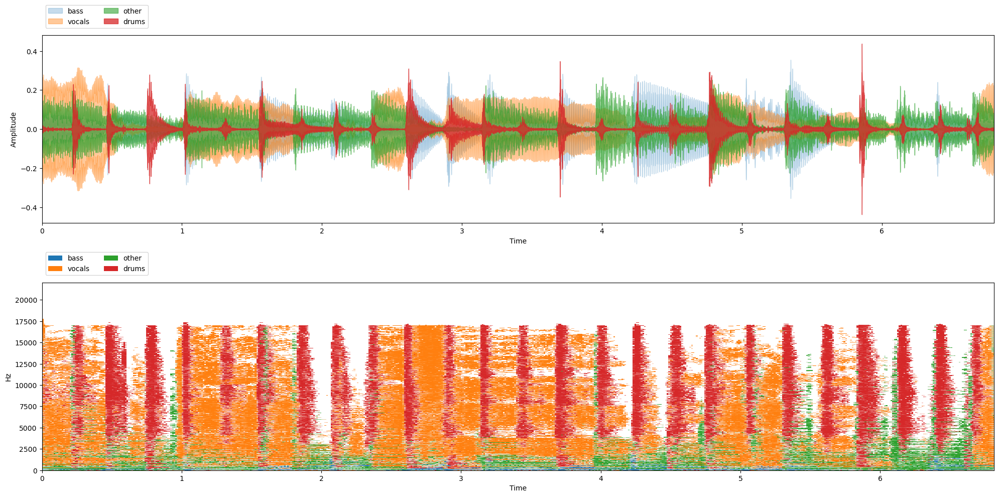


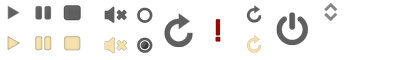
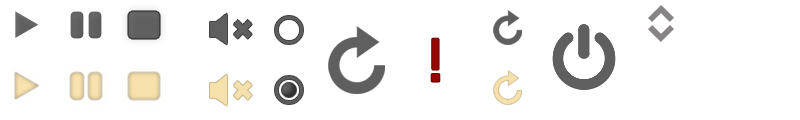
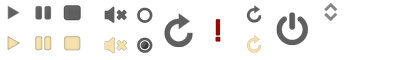

In [2]:
import torch
import nussl
from common import viz
import numpy as np
import matplotlib.pyplot as plt

musdb = nussl.datasets.MUSDB18(download=True)
item = musdb[40]

viz.show_sources(item['sources'])

### Visualisation of the mask 

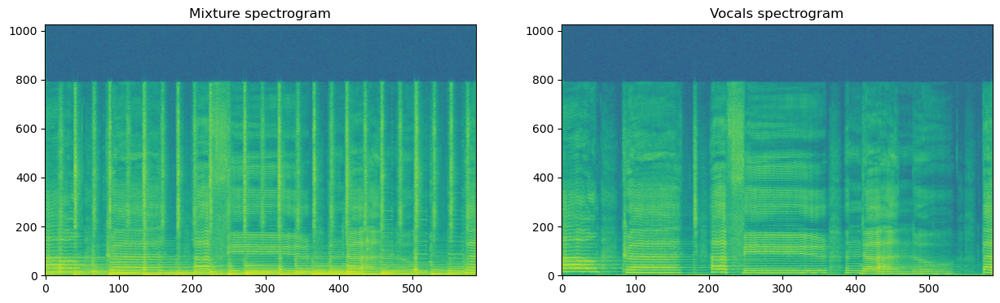

In [3]:
representation = np.abs(item['mix'].stft())
vocals_representation = np.abs(item['sources']['vocals'].stft())

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[1].set_title('Vocals spectrogram')
plt.show()

To build a soft mask for the vocals we take the maximum of the source spectrogram and the mixture spectrogram so that 𝑀̂ (𝑡,𝑓) stays between 0 and 1

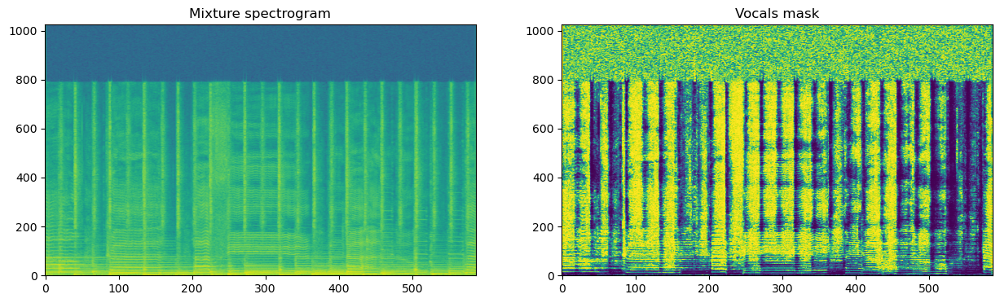

In [4]:
mask = vocals_representation / (np.maximum(vocals_representation, representation) + 1e-8)

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(mask[..., 0], origin='lower', aspect='auto')
ax[1].set_title('Vocals mask')
plt.show()

To actually apply the mask, just multiply it element-wise with the mixture spectrogram

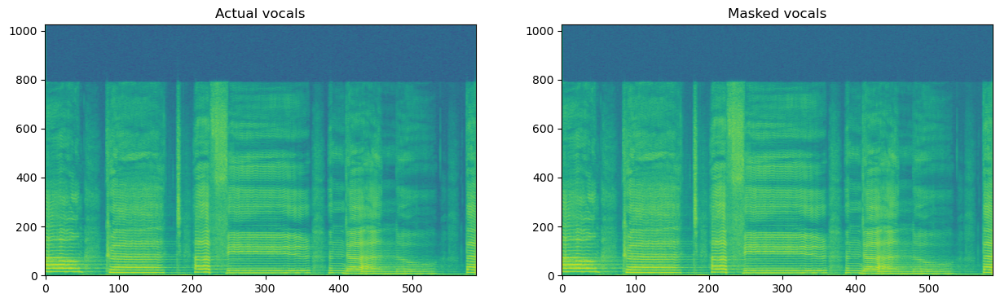

In [5]:
masked = mask * representation
fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Actual vocals')
ax[1].imshow(20 * np.log10(masked[..., 0]), origin='lower', aspect='auto')
ax[1].set_title('Masked vocals')
plt.show()

In [6]:
mix_phase = np.angle(item['mix'].stft())
masked_stft = masked * np.exp(1j * mix_phase)
new_signal = nussl.AudioSignal(stft=masked_stft, sample_rate=item['mix'].sample_rate)
new_signal.istft()
new_signal.embed_audio(display=False)

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with clang version 4.0.1 (tags/RELEASE_401/final)
  configuration: --prefix=/opt/miniconda3/envs/tf --cc=x86_64-apple-darwin13.4.0-clang --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpostproc    55.  5.100 / 55.  5.100
Guessed Channel Layout for Input Strea

Converting the numpy code to pytorch tensors 

In [7]:
mix_tensor = torch.from_numpy(representation)
mask_tensor = torch.rand_like(mix_tensor.unsqueeze(-1))

# shapes
print(mix_tensor.shape, mask_tensor.shape)

# masking operation:
masked_tensor = mix_tensor.unsqueeze(-1) * mask_tensor

print(masked_tensor.shape)

torch.Size([1025, 587, 2]) torch.Size([1025, 587, 2, 1])
torch.Size([1025, 587, 2, 1])


We just constructed a random mask then element wise multiplied it.

The shape of the mix tensor is: 
1. Number of frequency bins in the FFT
2. number of time steps 
3. number of audio channels 

The mask tensor has one additional dimension: 
- Number of sources (only 1 source here)

## Log magnitude representation 

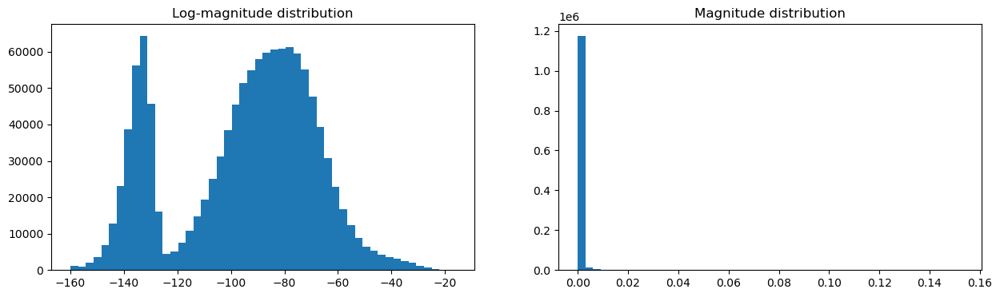

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].hist(20 * np.log10(np.maximum(representation, 1e-8)).flatten(), bins=50)
ax[0].set_title('Log-magnitude distribution')
ax[1].hist(representation.flatten(), bins=50)
ax[1].set_title('Magnitude distribution')
plt.show()

Log-magnitude representations:
- are more friendly to out neural network training 
- match human perception of volume which is logarithmic 
- generally give neural networks a leg up, both in terms of activations as well as a good representation of the audio that it starts from.

To do this in nussl:

In [9]:
from nussl.ml.networks.modules import AmplitudeToDB

amplitude_to_db = AmplitudeToDB()
mix_log_amplitude = amplitude_to_db(mix_tensor)
print(mix_tensor.mean(), mix_log_amplitude.mean())

tensor(0.0004, dtype=torch.float64) tensor(-75.9872, dtype=torch.float64)


Reshape mix_tensor to follow this pattern:

1. Dim 0: Batch size 
2. Dim 1: Sequence length (# of time steps)
3. Dim 2: # of frequency bins
4. Dim 3: # of audio channels (not convolutional channels)

In [11]:
mix_tensor.shape

torch.Size([1025, 587, 2])

In [12]:
print("Shape before (nf, nt, nac): ", mix_tensor.shape)
mix_tensor = mix_tensor.permute(1, 0, 2).unsqueeze(0).float()
print("Shape after (nb, nt, nf, nac):", mix_tensor.shape)

Shape before (nf, nt, nac):  torch.Size([1025, 587, 2])
Shape after (nb, nt, nf, nac): torch.Size([1, 587, 1025, 2])


Model not takes a mix spectrogram and computes the log magnitude features

In [13]:
class Model(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
    
    def forward(self, data):
        data = self.amplitude_to_db(data)
        return data
    
model = Model()
mix_log_amplitude = model(mix_tensor)

## Input normalisation 

critical feature of deep seperation models 

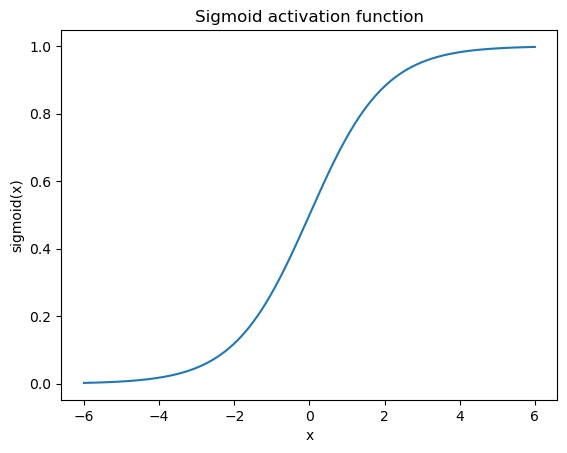

In [14]:
x = torch.linspace(-6, 6, 1000)
y = torch.sigmoid(x)
plt.plot(to_numpy(x), to_numpy(y))
plt.xlabel('x')
plt.ylabel('sigmoid(x)')
plt.title('Sigmoid activation function')
plt.show()

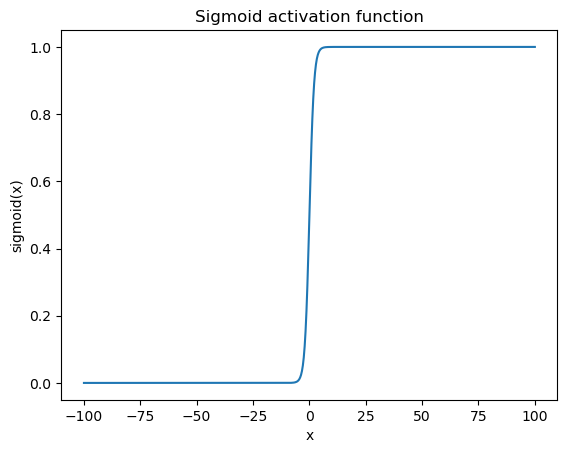

In [16]:
x = torch.linspace(-100, 100, 1000)
y = torch.sigmoid(x)
plt.plot(to_numpy(x), to_numpy(y))
plt.xlabel('x')
plt.ylabel('sigmoid(x)')
plt.title('Sigmoid activation function')
plt.show()

### Applying input normalisation with nussl:

In [17]:
from nussl.ml.networks.modules import BatchNorm

def print_stats(data):
    print(
        f"Shape: {data.shape}\n"
        f"Mean: {data.mean().item()}\n"
        f"Var: {data.var().item()}\n"
    )

input_normalization = BatchNorm(num_features=mix_tensor.shape[2])
mix_log_amplitude = amplitude_to_db(mix_tensor)

print_stats(mix_tensor)
print_stats(mix_log_amplitude)

normalized = input_normalization(mix_log_amplitude)

print_stats(mix_log_amplitude)
print_stats(normalized)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2])
Mean: -75.98717498779297
Var: 67.525146484375

Shape: torch.Size([1, 587, 1025, 2])
Mean: -75.98717498779297
Var: 67.525146484375

Shape: torch.Size([1, 587, 1025, 2])
Mean: 3.350758337461457e-09
Var: 0.7717075943946838



The batch norm layer in nussl automatically applies batch normalization to each frequency band, which is another popular trick for training separation networks

## Recurrent processing 

This is the heart of this model - a stack of recurrent layers that extract features from the normalized input representation of the mixture. The recurrent layer in nussl takes input with this shape:

1. Batch
2. Time
3. Frequency
4. Audio channels

and produces output with this shape:

1. Batch
2. Time
3. Hidden size



To implement the recurrent stack, we’ll use the nussl layer RecurrentStack. This layer does the following steps:

1. Reshapes the input data from (nb, nt, ...) to (nb, nt, -1), where -1 indicates however many points are left. If the input is multichannel, then the last dimension will be of size nf * nac, where nac is the number of audio channels.
2. Processes the input via a multi-layer stack of recurrent layers (generally LSTMs, but GRU is also an option).

In [18]:
from nussl.ml.networks.modules import RecurrentStack

nb, nt, nf, nac = mix_tensor.shape
recurrent_stack = RecurrentStack(
    nf * nac, 
    hidden_size=50, 
    num_layers=2, 
    bidirectional=True, 
    dropout=0.3
)

output = recurrent_stack(normalized)
print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 100])
Mean: 1.4174817124512629e-06
Var: 0.11670596897602081



In [19]:
class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
    def forward(self, data):
        data = self.amplitude_to_db(data)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        return data

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3)
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 100])
Mean: 0.0008972344803623855
Var: 0.11712745577096939



The bidirectional argument has an impact on which use-cases your model is appropriate for. If set to True, then your model will not be able to work in real time, as bidirectionality means that the model looks both forwards and backwards in time to predict features from a given sequence. Bidirectionality also doubles the size of the model, as the implementation is just two identical RNNs, one of which operates on the sequence in the original order, and the other which operates on the sequence in the reverse order.

## Mapping to a mask

we currently have the output of the recurrent stack, which has shape (batch, time, hidden_size). We need to map it to (batch, time, num_features, num_audio_channels, num_sources). We’ll do this by using the Embedding layer from nussl.

The Embedding layer performs the following steps:

1. Moves the dimension to be embedded (by default the last) to the end.
2. Uses a linear layer to map to (num_features * num_audio_channels * num_sources).
3. Reshapes the output of the linear layer.
4. Applies a non-linear activation function to the output (e.g. Sigmoid, ReLU, etc).

In [20]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, num_sources, 
                activation='sigmoid'):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   num_sources, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        data = self.amplitude_to_db(data)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        data = self.embedding(data)
        return data

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3, 1, 'sigmoid')
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2, 1])
Mean: 0.49991098046302795
Var: 0.0007009883411228657



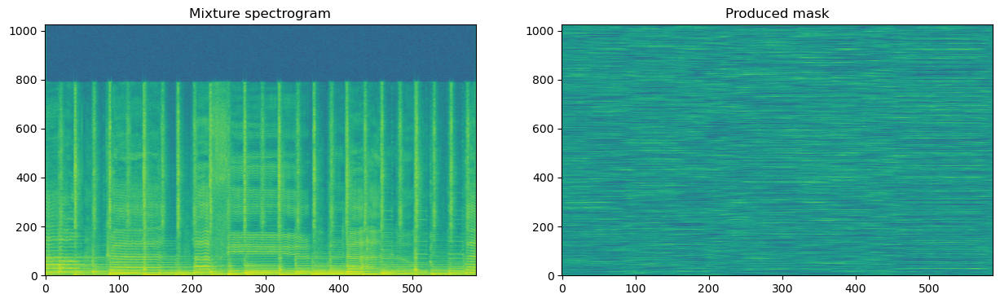

In [21]:
mask = to_numpy(output[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(mask[..., 0].T, origin='lower', aspect='auto')
ax[1].set_title('Produced mask')
plt.show()

## Applying the mask 

In [22]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, num_sources, 
                activation='sigmoid'):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   num_sources, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        mix_magnitude = data # save for masking
        
        data = self.amplitude_to_db(mix_magnitude)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        
        estimates = mix_magnitude.unsqueeze(-1) * mask
        return estimates

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3, 1, 'sigmoid')
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2, 1])
Mean: 0.00022057413298171014
Var: 1.717487634778081e-06



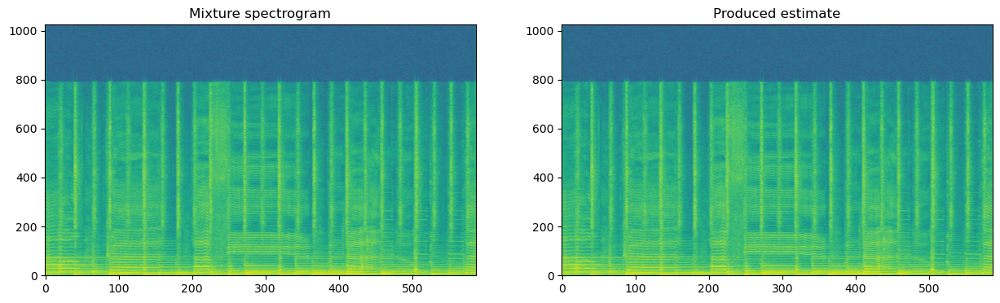

In [23]:
estimate = to_numpy(output[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(20 * np.log10(estimate[..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

# Deep Clustering 

Alternative way to to train source seperation networks

The idea is to project every time-frequency point to a D-dimensional unit-normalized embedding, and then use K-means clustering to extract the actual sources.

To make our model a deep clustering model, all we have to do is change how the “Embedding” layer works:

In [24]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, embedding_size, 
                activation=['sigmoid', 'unit_norm']):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   embedding_size, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        mix_magnitude = data # save for masking
        
        data = self.amplitude_to_db(mix_magnitude)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        
        estimates = mix_magnitude.unsqueeze(-1) * mask
        return estimates

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3, 20, ['sigmoid', 'unit_norm'])
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 587, 1025, 2, 20])
Mean: 9.840191341936588e-05
Var: 3.380243072115263e-07



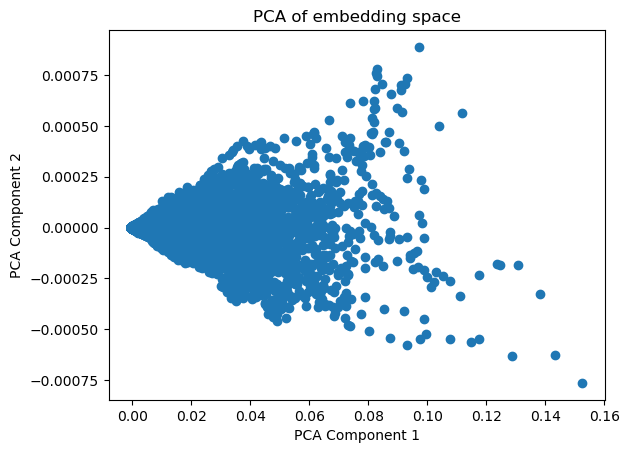

In [25]:
from sklearn.decomposition import PCA

np_output = to_numpy(output.reshape(-1, 20))
pca = PCA(n_components=2)
pca_output = pca.fit_transform(np_output)

plt.scatter(pca_output[:, 0], pca_output[:, 1])
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of embedding space')
plt.show()

Since we haven’t trained the network at all, yet, it’s just a big blob (one cluster). With a trained network, you’d see multiple tight clusters.

# Deep Audio estimation 

the trend has gone towards learning to output the waveform directly. In this part, we’ll build up a waveform in/waveform out model by adding components to our already built mask estimation model.



## Taking the STFT/iSTFT in a forward pass

nussl has an STFT module built in with both directions (transform and inverse) implemented

In [26]:
from nussl.ml.networks.modules import STFT

stft = STFT(2048, hop_length=512)
mix_audio = torch.from_numpy(item['mix'].audio_data).unsqueeze(0).float()
scipy_mag = np.abs(item['mix'].stft())
torch_stft = stft(mix_audio, direction='transform')
print(torch_stft.shape, scipy_mag.shape)

torch.Size([1, 587, 2050, 2]) (1025, 587, 2)


- The ordering of dimensions is different. In the torch STFT, the time axis goes second and the frequency axis third. There’s also a batch dimension.

- The torch STFT has twice the features along the frequency dimension. This is because the first half are the magnitude features and the second half are the phase features.



Magnitude spectrogram of the torch stft

torch.Size([1, 587, 2, 1025, 2])
torch.Size([1, 587, 1025, 2])


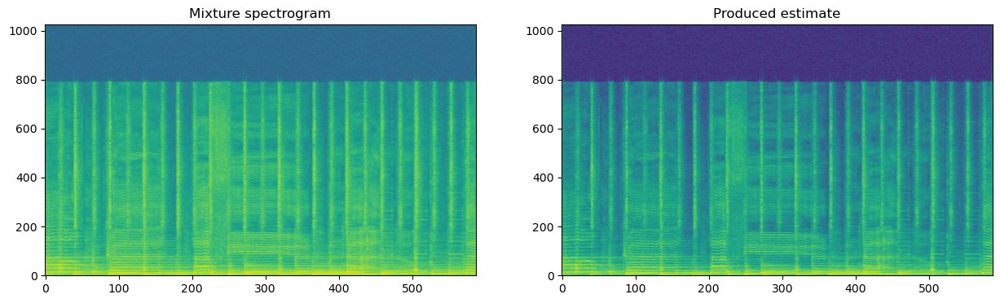

In [27]:
nb, nt, nf, nac = torch_stft.shape
# Stack the real/imag along the second to last axis
torch_stft = torch_stft.reshape(nb, nt, 2, -1, nac)
print(torch_stft.shape)
# Compute the magnitude
torch_mag, torch_phase = torch_stft[:, :, 0, ...], torch_stft[:, :, 1, ...]
print(torch_mag.shape)

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(scipy_mag[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(20 * np.log10(torch_mag[0, ..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

In [28]:
np.abs(torch_mag[0, ...,].permute(1, 0, 2).numpy() - scipy_mag).max()

3.4782241475905806e-08

### Modify model to take STFT/iSTFT

In [29]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, embedding_size, 
                 num_filters, hop_length, window_type='sqrt_hann', # New STFT parameters
                 activation=['sigmoid', 'unit_norm']):
        super().__init__()
        
        self.stft = STFT(
            num_filters, 
            hop_length=hop_length, 
            window_type=window_type
        )
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   embedding_size, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        # Take STFT inside model
        mix_stft = self.stft(data, direction='transform')
        nb, nt, nf, nac = mix_stft.shape
        # Stack the mag/phase along the second to last axis
        mix_stft = mix_stft.reshape(nb, nt, 2, -1, nac)
        mix_magnitude = mix_stft[:, :, 0, ...] # save for masking
        mix_phase = mix_stft[:, :, 1, ...] # save for reconstruction
        
        data = self.amplitude_to_db(mix_magnitude)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        
        # Mask the mixture spectrogram
        estimates = mix_magnitude.unsqueeze(-1) * mask
        
        # Recombine estimates with mixture phase
        mix_phase = mix_phase.unsqueeze(-1).expand_as(estimates)
        estimates = torch.cat([estimates, mix_phase], dim=2)
        estimate_audio = self.stft(estimates, direction='inverse')
        
        return estimate_audio

model = Model(1025, 2, 50, 2, True, 0.3, 2, 2048, 512)
output = model(mix_audio)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 2, 300032, 2])
Mean: 1.8178223399445415e-05
Var: 0.005776260979473591



In [30]:
for i in range(output.shape[-1]):
    source = output[0, ..., i]
    nussl.AudioSignal(audio_data_array=to_numpy(source), sample_rate=44100).embed_audio()

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with clang version 4.0.1 (tags/RELEASE_401/final)
  configuration: --prefix=/opt/miniconda3/envs/tf --cc=x86_64-apple-darwin13.4.0-clang --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpostproc    55.  5.100 / 55.  5.100
Guessed Channel Layout for Input Strea

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with clang version 4.0.1 (tags/RELEASE_401/final)
  configuration: --prefix=/opt/miniconda3/envs/tf --cc=x86_64-apple-darwin13.4.0-clang --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpostproc    55.  5.100 / 55.  5.100
Guessed Channel Layout for Input Strea

## Learned Filterbanks 

Most common way to calculate STFT is to:
1. Window the signal into small overlapping windows
2. Compute the FFT of each window seperately 
3. Each FFT becomes a frame of the STFT

The operation looks a bit like a convolution

1. Break up signal into small overlapping windows (stride of convolution == hop length of the STFT).
2. Cross-correlate each window with a set of learned filters.
3. The response of all the filters for each window becomes a “frame”.

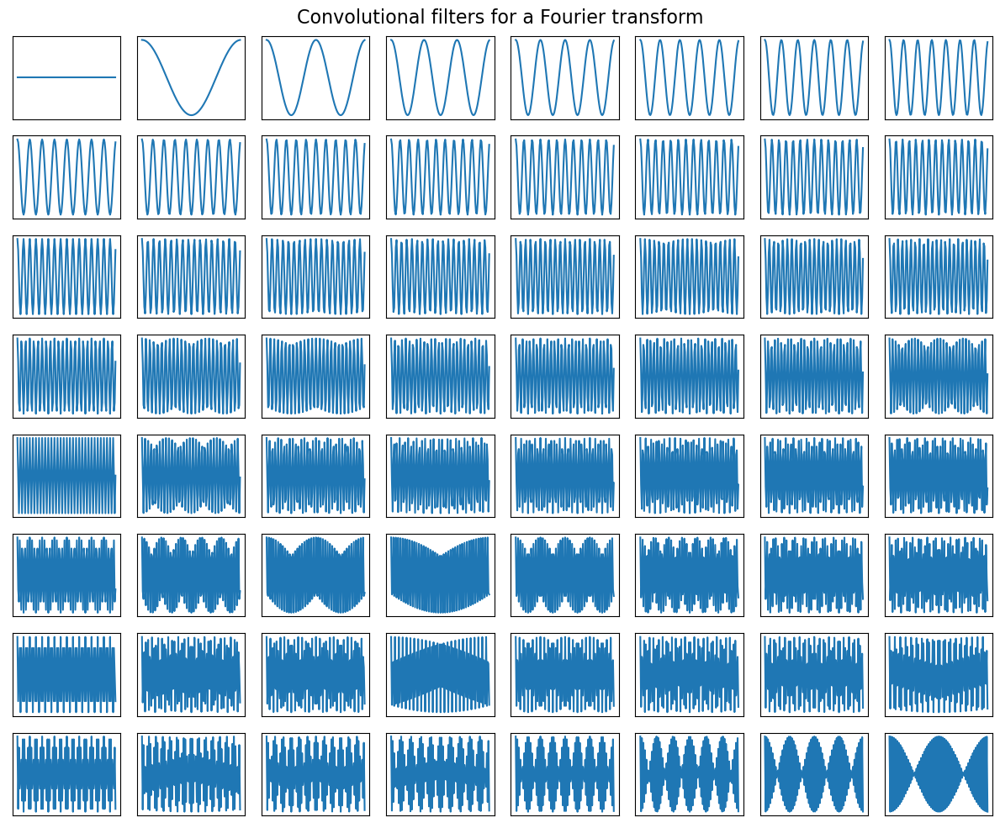

In [31]:
filter_length = 128

fig, ax = plt.subplots(8, 8, figsize=(12, 10))
ax = ax.flatten()

fourier_basis = torch.fft.rfft(
    torch.eye(filter_length)
)
cutoff = 1 + filter_length // 2
fourier_basis = torch.cat([
    torch.real(fourier_basis[:, :cutoff]),
    torch.imag(fourier_basis[:, :cutoff])
], dim=1)
fourier_basis = fourier_basis.float()

for i in range(ax.shape[-1]):
    ax[i].plot(to_numpy(fourier_basis)[:, i])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.suptitle('Convolutional filters for a Fourier transform', fontsize=16)
plt.tight_layout()
plt.show()

The next step is to make these filters learnable, by initialising them randomly. 

replace the nussl STFT module with the learnedFilterbank module 

In [32]:
from nussl.ml.networks.modules import LearnedFilterBank

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, embedding_size, 
                 num_filters, hop_length, window_type='rectangular', # Learned filterbank parameters
                 activation=['sigmoid', 'unit_norm']):
        super().__init__()
        
        self.representation = LearnedFilterBank(
            num_filters, 
            hop_length=hop_length, 
            window_type=window_type
        )
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   embedding_size, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        # Take STFT inside model
        mix_repr = self.representation(data, direction='transform')
        
        data = self.amplitude_to_db(mix_repr)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        
        # Mask the mixture spectrogram
        estimates = mix_repr.unsqueeze(-1) * mask
        
        # Recombine estimates with mixture phase
        estimate_audio = self.representation(estimates, direction='inverse')
        
        return estimate_audio

model = Model(128, 2, 50, 2, True, 0.3, 2, 128, 32)
output = model(mix_audio)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.00044009656994603574
Var: 6.760465112165548e-06

Shape: torch.Size([1, 2, 300032, 2])
Mean: 0.001926165772601962
Var: 25.08449935913086



Note that LearnedFilterBanks don’t have a strict concept of “phase” vs “magnitude”. Instead, they learn the two aspects jointly.